This used a latent space of only 256 dim for only greenfields. Unfortunatly this wasn't enougth for small features like sonic.

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
import torch
from torch.nn import functional as F
from torch.autograd import Variable
from torch import nn, optim
import torch.utils.data

# load as dask array
import dask.array as da
import dask
import h5py

import os
import glob
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm_notebook as tqdm

/home/wassname/.pyenv/versions/3.5.3/envs/jupyter3/lib/python3.5/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
from world_models_sonic.models.vae import VAE6, loss_function_vae
from world_models_sonic.helpers.summarize import TorchSummarizeDf
from world_models_sonic.helpers.dataset import load_cache_data
from world_models_sonic.models.rnn import MDNRNN2
from world_models_sonic.models.inverse_model import InverseModel
from world_models_sonic.models.world_model import WorldModel
from world_models_sonic.custom_envs.wrappers import discrete_actions
from world_models_sonic import config
len(discrete_actions)

10

# Init

In [4]:
cuda= torch.cuda.is_available()
env_name='sonic256'
num_epochs=200
batch_size = 2

# VAE loss function
lambda_vae_kld = 0.25
C = 0
z_dim = 256 # latent dimensions

# RNN
action_dim = 10
seq_len = 4
image_size=256
chunksize=seq_len*20



# loss function weights
lambda_vae = 1/20
lambda_finv = 1

data_cache_file = os.path.join(config.base_vae_data_dir, 'sonic_rnn_256_v30.hdf5')
NAME='RNN_v3b_256im_512z_1512_v5_greenfield'

# Load Data

In [5]:
loader_train, loader_test = load_cache_data(
    basedir=config.base_vae_data_dir, 
    env_name=env_name, 
    data_cache_file=data_cache_file, 
    image_size=image_size, 
    chunksize=chunksize, 
    action_dim=action_dim,
    batch_size=batch_size,
    seq_len=seq_len,
)
loader_train, loader_test
len(loader_train.dataset), len(loader_test.dataset)

Loaded from cache /MLDATA/sonic/vae/sonic_rnn_256_v30.hdf5


(40320, 10080)

# Load VAE

In [6]:
# Load VAE
# TODO swap z and k dim, since it's inconsistent with other models
vae = VAE6(image_size=image_size, z_dim=32, conv_dim=48, code_dim=8, k_dim=z_dim)
if cuda:
    vae.cuda()
    
# # Resume

# checkpoint_file = './outputs/models/VAE6_6_256im_512z_inception_CVAE_greenfields_state_dict.pkl'
# if os.path.isfile(checkpoint_file):
#     state_dict = torch.load(checkpoint_file)
#     vae.load_state_dict(state_dict)
#     print('loaded checkpoint_file {checkpoint_file}'.format(checkpoint_file=checkpoint_file))
    
save_file = './outputs/models/{NAME}-vae_state_dict.pkl'.format(NAME=NAME)
if os.path.isfile(save_file):
    state_dict = torch.load(save_file)
    vae.load_state_dict(state_dict)
    print('loaded save_file {save_file}'.format(save_file=save_file))

# Load RNN

In [7]:
# Load MDRNN
action_dim, hidden_size, n_mixture, temp = action_dim, 128, 3, 0.0


mdnrnn = MDNRNN2(z_dim, action_dim, hidden_size, n_mixture, temp)

if cuda:
    mdnrnn = mdnrnn.cuda()
    
# # Resume?
save_file = './outputs/models/{NAME}-mdnrnn_state_dict.pkl'.format(NAME=NAME)
if os.path.isfile(save_file):
    state_dict = torch.load(save_file)
    mdnrnn.load_state_dict(state_dict)
    print('loaded {save_file}'.format(save_file=save_file))

# Load inverse model

In [9]:
finv = InverseModel(z_dim, action_dim, hidden_size=256).cuda()

# Resume?
save_file = './outputs/models/{NAME}-finv_state_dict.pkl'.format(NAME=NAME)
if os.path.isfile(save_file):
    state_dict = torch.load(save_file)
    finv.load_state_dict(state_dict)
    print('loaded {save_file}'.format(save_file=save_file))

# Init

In [10]:
model = WorldModel(vae, mdnrnn, finv)
model

WorldModel(
  (vae): VAE6(
    (logvar): Linear(in_features=2048, out_features=256, bias=True)
    (mu): Linear(in_features=2048, out_features=256, bias=True)
    (z): Linear(in_features=256, out_features=2048, bias=True)
    (encoder): Sequential(
      (0): BasicConv2d(
        (conv): Conv2d(3, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act): LeakyReLU(negative_slope=0.01, inplace)
      )
      (1): ConvBlock5(
        (conv0): InceptionA(
          (branch1x1): BasicConv2d(
            (conv): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (bn): BatchNorm2d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (act): LeakyReLU(negative_slope=0.01, inplace)
          )
          (branch5x5_1): BasicConv2d(
            (conv): Conv2d(48, 9, kernel_size=(1, 1), stride=(1, 1))
            (bn): BatchNorm2d(9, eps=1e-05, momentum=0.

# Train helpers

In [11]:
# Plot reconstructions
def plot_results(loader, n=2, epoch=0, figsize=(9,6)):
    vae.eval()
    mdnrnn.eval()
    
    observations, actions, rewars, dones = next(iter(loader))
    
    X = Variable(observations.transpose(1,3))
    _, channels, height, width = X.size()
    if cuda:
        X=X.cuda()
    Y, mu_vae, logvar = vae.forward(X)
    loss_recon, loss_KLD = loss_function_vae(Y, X, mu_vae, logvar)
    loss_vae = loss_recon + lambda_vae_kld * torch.abs(loss_KLD-C)
    
    # TODO do we want to sample in test or training mode?
    z_v = vae.sample(mu_vae, logvar)
    
    z_v = z_v.view(batch_size, seq_len, -1)
    Y = Y.view((batch_size, seq_len, channels, height, width))
    X = X.view((batch_size, seq_len, channels, height, width))
    loss_vae = loss_vae.view(batch_size, seq_len)
    actions = actions.view(batch_size, seq_len)
    
    # Forward
    actions_v = Variable(actions).float()
    

    if cuda:
        z_v=z_v.cuda()
        actions_v=actions_v.cuda()
    pi, mu, sigma, hidden_state = mdnrnn.forward(z_v, actions_v)
    z_true_next = z_v[:,1:]
    loss_mdn_rnn = mdnrnn.rnn_loss(z_true_next, pi[:,:-1], mu[:,:-1], sigma[:,:-1])
    
    mu2 = mu.mean(2).view((batch_size*seq_len, mdnrnn.z_dim))
    X_pred = vae.decode(mu2)
    X_pred = X_pred.view((batch_size, seq_len, channels, height, width))
     
    # Finv forward
    z_next_pred = mdnrnn.sample(pi, mu, sigma)
    action_pred = finv(z_v[:,1:], z_next_pred[:,:-1]).float()
    
    actions_v_hot = torch.eye(action_dim)[actions_v.long()].cuda()
    loss_inv = F.binary_cross_entropy_with_logits(action_pred, actions_v_hot[:,1:])
    action_pred_int = action_pred.max(-1)[1]
    print(action_pred_int)
    
    loss = loss_vae.mean(1) + loss_mdn_rnn.mean(1) + loss_inv.mean()
    
    for i in np.linspace(0,seq_len-2,n):
        batch = np.random.randint(0,batch_size)
        i=int(i)
        y=Y[batch][i].cpu().data.transpose(0,2).numpy()
        x_orig = X[batch][i].transpose(0,2).data.cpu().numpy()
        x_next = X[batch][i+1].transpose(0,2).data.cpu().numpy()
        x_pred = X_pred[batch][i].transpose(0,2).data.cpu().numpy()
        loss_vae_i = loss_vae[batch][i].cpu().data.item()
        loss_mdnrnn_i = loss_mdn_rnn[batch][i].cpu().data.item()
        loss_inv_i = loss_inv.cpu().data.item()
        loss_i = loss[batch].cpu().data.item()
        
        print('action_pred', action_pred_int[batch][i].data.cpu().item())
        print('action_true', actions_v[:,1:][batch][i].data.cpu().item())
        print('finv loss {:2.4f}'.format(loss_inv_i))
        
        plt.figure(figsize=figsize)
        
        plt.subplot(2, 3, 1)
        plt.axis("off")
        plt.title('original')
        plt.imshow(x_orig)

        plt.subplot(2, 3, 4)
        plt.axis("off")
        plt.imshow(y)
        plt.title('reconstructed \nloss_vae={:2.4f}'.format(loss_vae_i))
           
        plt.subplot(2, 3, 2)
        plt.axis("off")
        plt.imshow(x_next)
        plt.title('true next')
        
        plt.subplot(2, 3, 5)
        plt.axis("off")
        plt.imshow(x_pred)
        plt.title('pred next \nloss_mdnrnn={:2.4f}'.format(loss_mdnrnn_i))
        
        plt.subplot(2, 3, 3)
        plt.axis("off")
        plt.imshow(np.abs(x_orig-x_next))
        plt.title('actual changes')
        
        plt.subplot(2, 3, 6)
        plt.axis("off")
        plt.imshow(np.abs(y[i]-x_pred))
        plt.title('predicted changes')

        plt.suptitle('epoch {}, seq index {}, batch={}. loss {:2.4f}'.format(
            epoch, 
            i,
            batch,
            loss_i
        ))
#         plt.subplots_adjust(wspace=-.4, hspace=.1)#, bottom=0.1, right=0.8, top=0.9)
        plt.show()
        


In [12]:
import collections

def train(loader, vae, mdnrnn, optimizer, max_batches=None, test=False, cuda=True, joint_training=False):
    vae.eval()
    if test:
        mdnrnn.eval()
    else:
        mdnrnn.train()
    info = collections.defaultdict(list)
    hidden_state = None
    if max_batches is None:
        max_batches = len(loader)
    else:
        max_batches = min(max_batches, len(loader))
    iterator = iter(loader)

    with tqdm(total=max_batches*loader.batch_size, mininterval=0.5, desc='test' if test else 'training') as prog:
        for i in range(max_batches):
            # the loader batch_size is seq_len*batch_size
            # we put it through the VAE as (seq_len*batch_size,...)
            # then reshape to (batch_size,seq_len,...) for the mdnrnn
            observations, actions, rewards, dones = next(iterator)
            X = Variable(observations.transpose(1,3))
            if cuda:
                X=X.cuda()
                
            # VAE forward
            Y, mu_vae, logvar = vae.forward(X)
            
            loss_recon, loss_KLD = loss_function_vae(Y, X, mu_vae, logvar)
            loss_vae = loss_recon + lambda_vae_kld * torch.abs(loss_KLD-C)
            loss_vae = loss_vae.mean() # mean along the batches

            # MDNRNN Forward
            z_v = vae.sample(mu_vae, logvar)
            z_v = z_v.view(batch_size, seq_len, -1)
            actions_v = Variable(actions).float()
            actions_v = actions_v.view(batch_size, seq_len)
            if cuda:
                z_v=z_v.cuda()
                actions_v=actions_v.cuda()
            pi, mu, sigma, hidden_state = mdnrnn.forward(z_v, actions_v)

            # We are evaluating how the output distribution for the next step
            # matches the real next step. So we have to discard the last step in the 
            # sequence which has no next step.
            z_true_next = z_v[:,1:]
            loss_mdn = mdnrnn.rnn_loss(z_true_next, pi[:,:-1], mu[:,:-1], sigma[:,:-1]).mean()
#             loss_mdn += 10 # this is to make sure it stays positive
            
            # Finv forward
            z_next_pred = mdnrnn.sample(pi, mu, sigma)
            action_pred = finv(z_v[:,1:], z_next_pred[:,:-1]).float()
            actions_v_hot = torch.eye(action_dim)[actions_v.long()].cuda()
            loss_inv = F.binary_cross_entropy_with_logits(action_pred, actions_v_hot[:,1:])
#             loss_inv = ((action_pred-actions_v_hot[:,1:])**2).sum(-1)
            loss_inv = loss_inv.mean()
            
            loss = loss_mdn + lambda_finv * loss_inv + lambda_vae * loss_vae

            if not test:
                loss.backward()
                optimizer.step()
                optimizer.zero_grad()

            # Record
            info['loss_inv'].append(loss_inv.cpu().data.numpy())
            info['loss_mdn'].append(loss_mdn.cpu().data.numpy())
            info['loss_vae'].append(loss_vae.cpu().data.numpy())
            info['loss_recon'].append(loss_recon.mean().cpu().data.item())
            info['loss_KLD'].append(loss_KLD.mean().cpu().data.item())
            
            prog.update(loader.batch_size)
            prog.desc='loss={loss:2.4f}, loss_rnn={loss_mdn:2.4f}, loss_inv= {loss_inv2:2.4f}={lambda_finv}* {loss_inv:2.4f}, loss_vae={loss_vae:2.4f}={lambda_vae:2.4f} * ({loss_recon:2.2f} + {lambda_vae_kld}*|{loss_KLD:2.2f} - {C}|)'.format(
                loss=loss.cpu().data.item(),
                loss_mdn=np.mean(info['loss_mdn']), 
                loss_recon=np.mean(info['loss_recon']),
                loss_KLD=np.mean(info['loss_KLD']),
                loss_vae=lambda_vae*(np.mean(info['loss_recon'])+lambda_vae_kld*(np.mean(info['loss_KLD'])-C)),
                loss_inv=np.mean(info['loss_inv']),
                loss_inv2=np.mean(info['loss_inv'])*lambda_finv,
                lambda_vae_kld=lambda_vae_kld,
                lambda_finv=lambda_finv,
                lambda_vae=lambda_vae,
                C=C
            )
            if i%400==0:
                print('[{}/{}]'.format(i, max_batches), prog.desc)

        print(prog.desc)
        prog.close()

    return info

# Train

In [37]:
import torch.optim.lr_scheduler
torch.cuda.empty_cache()
optimizer = optim.Adam(model.parameters(), lr=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, verbose=True)
max_batches=20000//loader_train.batch_size
max_batches

2500

In [14]:
# Load previous history
import pandas as pd
if os.path.isfile('./outputs/models/{NAME}.csv'.format(NAME=NAME)):
    histories = pd.read_csv('./outputs/models/{NAME}.csv'.format(NAME=NAME)).to_dict(orient='records')
else:
    histories = []

[0/2500] loss=101.4953, loss_rnn=15.2075, loss_inv= 0.7218=1* 0.7218, loss_vae=85.5659=0.0500 * (1710.76 + 0.25*|2.23 - 0|)


/home/wassname/.pyenv/versions/3.5.3/envs/jupyter3/lib/python3.5/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


[400/2500] loss=128.7987, loss_rnn=15.4531, loss_inv= 0.7158=1* 0.7158, loss_vae=120.5099=0.0500 * (2409.80 + 0.25*|1.58 - 0|)
[800/2500] loss=120.4702, loss_rnn=15.2638, loss_inv= 0.7181=1* 0.7181, loss_vae=108.6769=0.0500 * (2173.13 + 0.25*|1.62 - 0|)
[1200/2500] loss=51.9437, loss_rnn=15.2993, loss_inv= 0.7172=1* 0.7172, loss_vae=114.1759=0.0500 * (2283.11 + 0.25*|1.62 - 0|)
[1600/2500] loss=127.8123, loss_rnn=15.2893, loss_inv= 0.7172=1* 0.7172, loss_vae=114.1051=0.0500 * (2281.70 + 0.25*|1.60 - 0|)
[2000/2500] loss=134.3595, loss_rnn=15.2738, loss_inv= 0.7179=1* 0.7179, loss_vae=115.6338=0.0500 * (2312.28 + 0.25*|1.60 - 0|)
[2400/2500] loss=194.2223, loss_rnn=15.2645, loss_inv= 0.7180=1* 0.7180, loss_vae=114.8463=0.0500 * (2296.53 + 0.25*|1.60 - 0|)
loss=41.7654, loss_rnn=15.2660, loss_inv= 0.7179=1* 0.7179, loss_vae=114.7762=0.0500 * (2295.12 + 0.25*|1.60 - 0|)



[0/416] loss=117.7235, loss_rnn=14.8544, loss_inv= 0.7218=1* 0.7218, loss_vae=102.1472=0.0500 * (2042.40 + 0.25*|2.18 - 0|)
[400/416] loss=116.4555, loss_rnn=16.0369, loss_inv= 0.7158=1* 0.7158, loss_vae=129.9991=0.0500 * (2599.54 + 0.25*|1.79 - 0|)
loss=176.4330, loss_rnn=16.0339, loss_inv= 0.7159=1* 0.7159, loss_vae=130.0249=0.0500 * (2600.05 + 0.25*|1.79 - 0|)

Epoch 0, loss=15.2660, loss_val=16.0339, loss_vae=2295.5237, loss_vae_val=2600.4988,  loss_finv=nan, loss_finv_vae=nan, ,


/home/wassname/.pyenv/versions/3.5.3/envs/jupyter3/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/wassname/.pyenv/versions/3.5.3/envs/jupyter3/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.6885


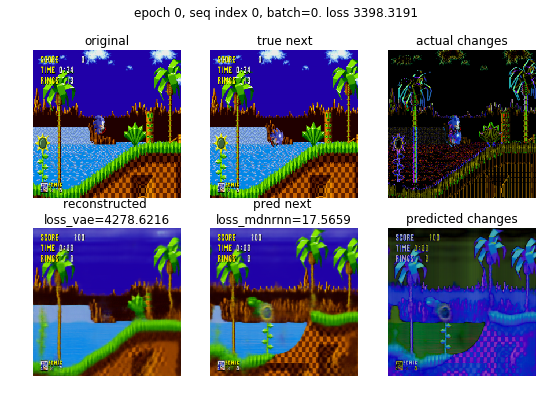

action_pred 2
action_true 2.0
finv loss 0.6885


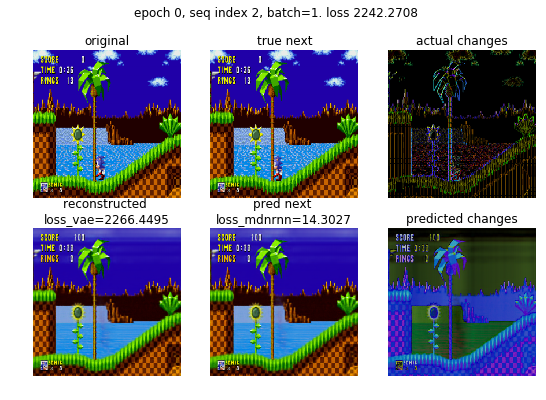

[0/2500] loss=32.4907, loss_rnn=15.4563, loss_inv= 0.7218=1* 0.7218, loss_vae=16.3126=0.0500 * (325.93 + 0.25*|1.31 - 0|)
[400/2500] loss=48.0245, loss_rnn=15.2963, loss_inv= 0.7170=1* 0.7170, loss_vae=123.6854=0.0500 * (2473.34 + 0.25*|1.49 - 0|)
[800/2500] loss=123.7575, loss_rnn=15.2246, loss_inv= 0.7193=1* 0.7193, loss_vae=118.2789=0.0500 * (2365.22 + 0.25*|1.42 - 0|)
[1200/2500] loss=230.2431, loss_rnn=15.2799, loss_inv= 0.7185=1* 0.7185, loss_vae=121.6804=0.0500 * (2433.23 + 0.25*|1.50 - 0|)
[1600/2500] loss=18.2525, loss_rnn=15.2760, loss_inv= 0.7182=1* 0.7182, loss_vae=121.2676=0.0500 * (2424.97 + 0.25*|1.52 - 0|)
[2000/2500] loss=141.6116, loss_rnn=15.2779, loss_inv= 0.7183=1* 0.7183, loss_vae=121.1726=0.0500 * (2423.07 + 0.25*|1.53 - 0|)
[2400/2500] loss=223.3297, loss_rnn=15.2646, loss_inv= 0.7188=1* 0.7188, loss_vae=119.7526=0.0500 * (2394.66 + 0.25*|1.55 - 0|)
loss=127.3833, loss_rnn=15.2677, loss_inv= 0.7187=1* 0.7187, loss_vae=119.6911=0.0500 * (2393.43 + 0.25*|1.56 - 0|

[0/416] loss=293.5291, loss_rnn=16.7955, loss_inv= 0.7218=1* 0.7218, loss_vae=276.0118=0.0500 * (5519.91 + 0.25*|1.30 - 0|)
[400/416] loss=334.3190, loss_rnn=16.0344, loss_inv= 0.7154=1* 0.7154, loss_vae=133.6422=0.0500 * (2672.43 + 0.25*|1.65 - 0|)
loss=124.4932, loss_rnn=16.0427, loss_inv= 0.7153=1* 0.7153, loss_vae=136.2055=0.0500 * (2723.70 + 0.25*|1.64 - 0|)

Epoch 1, loss=15.2677, loss_val=16.0427, loss_vae=2393.8225, loss_vae_val=2724.1094,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7052


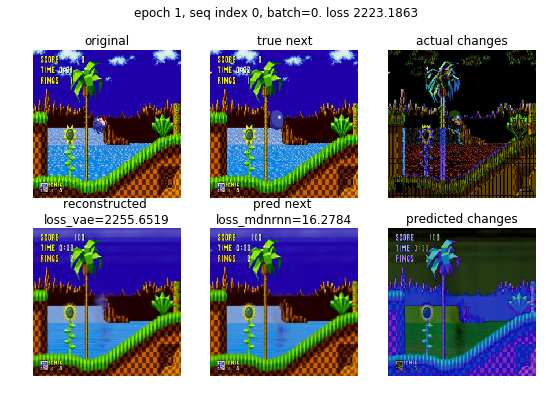

action_pred 2
action_true 2.0
finv loss 0.7052


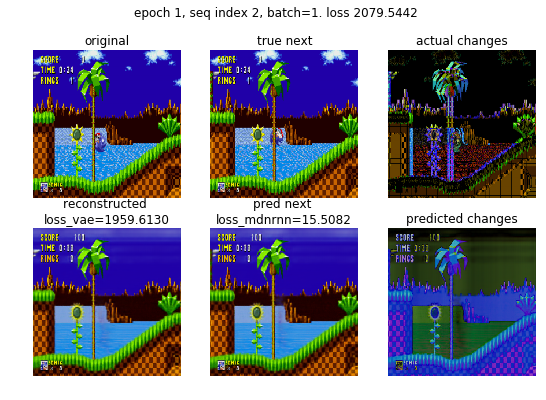

[0/2500] loss=54.0730, loss_rnn=15.6493, loss_inv= 0.7052=1* 0.7052, loss_vae=37.7186=0.0500 * (754.18 + 0.25*|0.78 - 0|)
[400/2500] loss=127.0419, loss_rnn=15.4106, loss_inv= 0.7168=1* 0.7168, loss_vae=117.5446=0.0500 * (2350.50 + 0.25*|1.57 - 0|)
[800/2500] loss=125.0106, loss_rnn=15.3231, loss_inv= 0.7189=1* 0.7189, loss_vae=118.8359=0.0500 * (2376.34 + 0.25*|1.51 - 0|)
[1200/2500] loss=238.7972, loss_rnn=15.2968, loss_inv= 0.7200=1* 0.7200, loss_vae=119.8690=0.0500 * (2397.00 + 0.25*|1.51 - 0|)
[1600/2500] loss=14.0289, loss_rnn=15.3019, loss_inv= 0.7196=1* 0.7196, loss_vae=121.5056=0.0500 * (2429.74 + 0.25*|1.51 - 0|)
[2000/2500] loss=80.2872, loss_rnn=15.2611, loss_inv= 0.7197=1* 0.7197, loss_vae=119.3287=0.0500 * (2386.19 + 0.25*|1.52 - 0|)
[2400/2500] loss=13.9443, loss_rnn=15.2452, loss_inv= 0.7194=1* 0.7194, loss_vae=118.9740=0.0500 * (2379.10 + 0.25*|1.54 - 0|)
loss=128.8701, loss_rnn=15.2217, loss_inv= 0.7196=1* 0.7196, loss_vae=117.4365=0.0500 * (2348.35 + 0.25*|1.53 - 0|)

[0/416] loss=124.6780, loss_rnn=14.9310, loss_inv= 0.7218=1* 0.7218, loss_vae=109.0252=0.0500 * (2180.11 + 0.25*|1.57 - 0|)
[400/416] loss=143.6204, loss_rnn=15.9514, loss_inv= 0.7154=1* 0.7154, loss_vae=123.4778=0.0500 * (2469.11 + 0.25*|1.80 - 0|)
loss=115.7574, loss_rnn=15.9543, loss_inv= 0.7154=1* 0.7154, loss_vae=123.3074=0.0500 * (2465.70 + 0.25*|1.81 - 0|)

Epoch 2, loss=15.2217, loss_val=15.9543, loss_vae=2348.7295, loss_vae_val=2466.1479,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 8.0
finv loss 0.7052


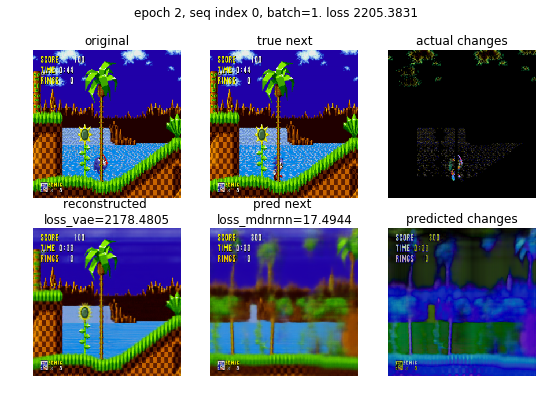

action_pred 2
action_true 5.0
finv loss 0.7052


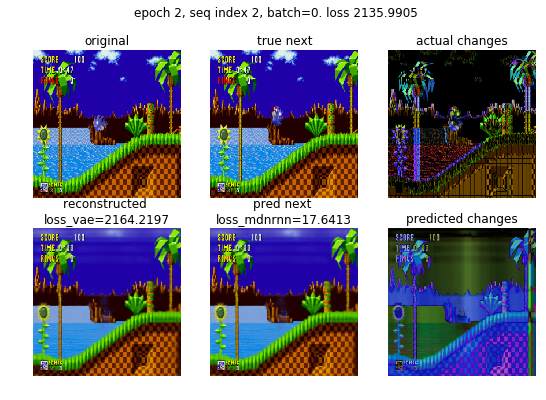

[0/2500] loss=130.7878, loss_rnn=15.9549, loss_inv= 0.7218=1* 0.7218, loss_vae=114.1111=0.0500 * (2281.77 + 0.25*|1.79 - 0|)
[400/2500] loss=126.3083, loss_rnn=15.3718, loss_inv= 0.7178=1* 0.7178, loss_vae=126.7860=0.0500 * (2535.32 + 0.25*|1.58 - 0|)
[800/2500] loss=93.6616, loss_rnn=15.2200, loss_inv= 0.7190=1* 0.7190, loss_vae=115.5602=0.0500 * (2310.81 + 0.25*|1.58 - 0|)
[1200/2500] loss=52.7704, loss_rnn=15.2454, loss_inv= 0.7184=1* 0.7184, loss_vae=116.9444=0.0500 * (2338.50 + 0.25*|1.55 - 0|)
[1600/2500] loss=124.8273, loss_rnn=15.2551, loss_inv= 0.7183=1* 0.7183, loss_vae=117.6699=0.0500 * (2353.02 + 0.25*|1.53 - 0|)
[2000/2500] loss=95.9152, loss_rnn=15.2470, loss_inv= 0.7182=1* 0.7182, loss_vae=116.7931=0.0500 * (2335.48 + 0.25*|1.53 - 0|)
[2400/2500] loss=253.1038, loss_rnn=15.2329, loss_inv= 0.7184=1* 0.7184, loss_vae=116.3106=0.0500 * (2325.83 + 0.25*|1.52 - 0|)
loss=134.4790, loss_rnn=15.2179, loss_inv= 0.7187=1* 0.7187, loss_vae=115.6043=0.0500 * (2311.71 + 0.25*|1.51 - 

[0/416] loss=132.1939, loss_rnn=15.1672, loss_inv= 0.7052=1* 0.7052, loss_vae=116.3216=0.0500 * (2326.07 + 0.25*|1.46 - 0|)
[400/416] loss=221.5708, loss_rnn=15.8601, loss_inv= 0.7156=1* 0.7156, loss_vae=123.7347=0.0500 * (2474.31 + 0.25*|1.52 - 0|)
loss=155.7987, loss_rnn=15.8832, loss_inv= 0.7156=1* 0.7156, loss_vae=126.6270=0.0500 * (2532.16 + 0.25*|1.52 - 0|)

Epoch 3, loss=15.2179, loss_val=15.8832, loss_vae=2312.0859, loss_vae_val=2532.5393,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 8.0
finv loss 0.7218


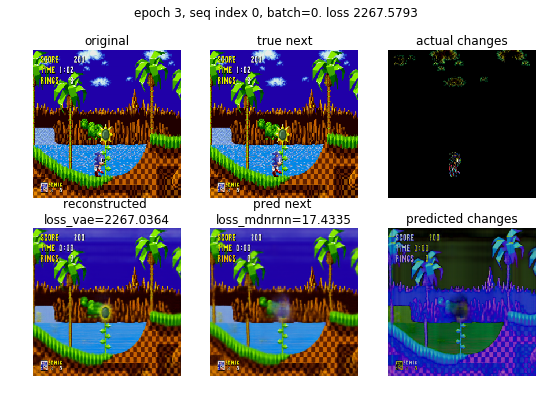

action_pred 2
action_true 2.0
finv loss 0.7218


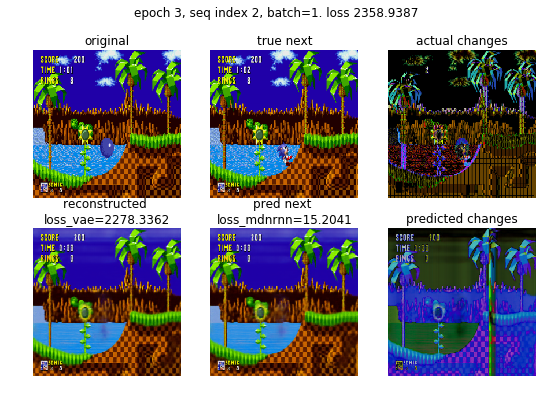

[0/2500] loss=115.4379, loss_rnn=15.7700, loss_inv= 0.7218=1* 0.7218, loss_vae=98.9461=0.0500 * (1978.59 + 0.25*|1.33 - 0|)
[400/2500] loss=48.1235, loss_rnn=15.0329, loss_inv= 0.7193=1* 0.7193, loss_vae=103.3396=0.0500 * (2066.44 + 0.25*|1.39 - 0|)
[800/2500] loss=14.8658, loss_rnn=15.0910, loss_inv= 0.7189=1* 0.7189, loss_vae=111.4828=0.0500 * (2229.31 + 0.25*|1.38 - 0|)
[1200/2500] loss=13.6960, loss_rnn=15.1310, loss_inv= 0.7188=1* 0.7188, loss_vae=113.5349=0.0500 * (2270.35 + 0.25*|1.41 - 0|)
[1600/2500] loss=183.9297, loss_rnn=15.1433, loss_inv= 0.7190=1* 0.7190, loss_vae=113.0369=0.0500 * (2260.39 + 0.25*|1.40 - 0|)
[2000/2500] loss=128.4023, loss_rnn=15.1364, loss_inv= 0.7190=1* 0.7190, loss_vae=115.0117=0.0500 * (2299.88 + 0.25*|1.41 - 0|)
[2400/2500] loss=15.1520, loss_rnn=15.1635, loss_inv= 0.7189=1* 0.7189, loss_vae=116.6553=0.0500 * (2332.75 + 0.25*|1.41 - 0|)
loss=130.6048, loss_rnn=15.1633, loss_inv= 0.7188=1* 0.7188, loss_vae=116.2538=0.0500 * (2324.72 + 0.25*|1.42 - 0|

[0/416] loss=121.9570, loss_rnn=15.1783, loss_inv= 0.7052=1* 0.7052, loss_vae=106.0736=0.0500 * (2121.10 + 0.25*|1.50 - 0|)
[400/416] loss=144.5175, loss_rnn=16.0955, loss_inv= 0.7159=1* 0.7159, loss_vae=151.3405=0.0500 * (3026.42 + 0.25*|1.56 - 0|)
loss=211.6607, loss_rnn=16.0937, loss_inv= 0.7157=1* 0.7157, loss_vae=151.7714=0.0500 * (3035.04 + 0.25*|1.55 - 0|)

Epoch 4, loss=15.1633, loss_val=16.0937, loss_vae=2325.0754, loss_vae_val=3035.4280,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 3.0
finv loss 0.7218


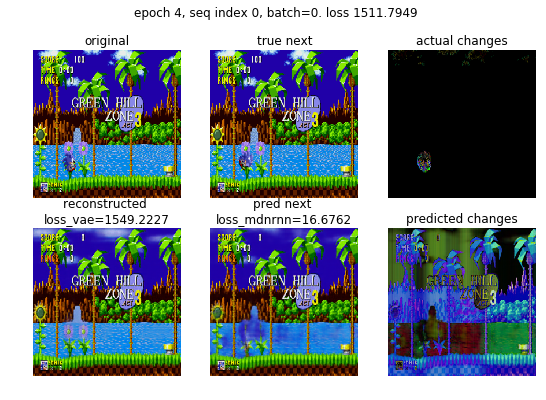

action_pred 2
action_true 2.0
finv loss 0.7218


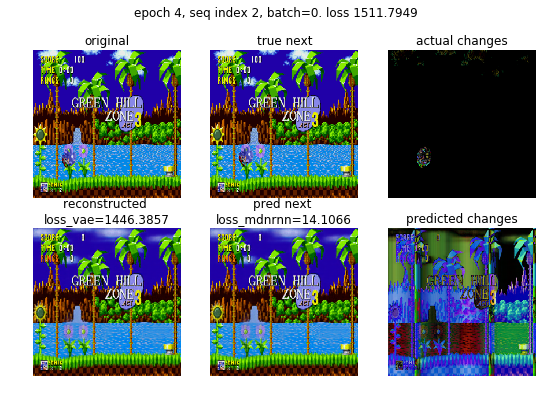

[0/2500] loss=237.2616, loss_rnn=16.4213, loss_inv= 0.7218=1* 0.7218, loss_vae=220.1185=0.0500 * (4402.15 + 0.25*|0.87 - 0|)
[400/2500] loss=134.0487, loss_rnn=15.1393, loss_inv= 0.7198=1* 0.7198, loss_vae=111.1273=0.0500 * (2222.19 + 0.25*|1.44 - 0|)
[800/2500] loss=268.1812, loss_rnn=15.1525, loss_inv= 0.7191=1* 0.7191, loss_vae=109.4113=0.0500 * (2187.86 + 0.25*|1.45 - 0|)
[1200/2500] loss=175.2225, loss_rnn=15.1454, loss_inv= 0.7183=1* 0.7183, loss_vae=110.8395=0.0500 * (2216.42 + 0.25*|1.47 - 0|)
[1600/2500] loss=135.4671, loss_rnn=15.1818, loss_inv= 0.7185=1* 0.7185, loss_vae=114.3398=0.0500 * (2286.43 + 0.25*|1.46 - 0|)
[2000/2500] loss=238.6601, loss_rnn=15.1540, loss_inv= 0.7184=1* 0.7184, loss_vae=113.4284=0.0500 * (2268.21 + 0.25*|1.45 - 0|)
[2400/2500] loss=137.3150, loss_rnn=15.1867, loss_inv= 0.7183=1* 0.7183, loss_vae=116.9347=0.0500 * (2338.34 + 0.25*|1.43 - 0|)
loss=124.8300, loss_rnn=15.1895, loss_inv= 0.7182=1* 0.7182, loss_vae=116.9184=0.0500 * (2338.01 + 0.25*|1.44

[0/416] loss=125.7235, loss_rnn=15.1558, loss_inv= 0.7218=1* 0.7218, loss_vae=109.8459=0.0500 * (2196.54 + 0.25*|1.51 - 0|)
[400/416] loss=16.5446, loss_rnn=16.0048, loss_inv= 0.7161=1* 0.7161, loss_vae=135.8245=0.0500 * (2716.12 + 0.25*|1.50 - 0|)
loss=138.6279, loss_rnn=15.9878, loss_inv= 0.7161=1* 0.7161, loss_vae=132.6334=0.0500 * (2652.29 + 0.25*|1.49 - 0|)

Epoch 5, loss=15.1895, loss_val=15.9878, loss_vae=2338.3679, loss_vae_val=2652.6682,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.6885


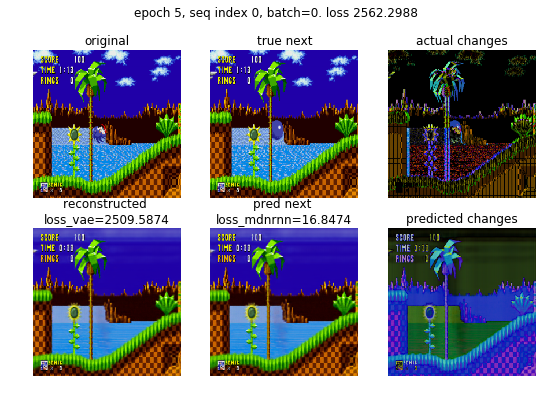

action_pred 2
action_true 2.0
finv loss 0.6885


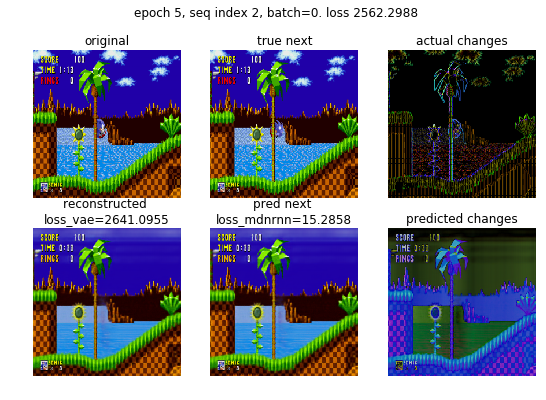

[0/2500] loss=48.0857, loss_rnn=15.4401, loss_inv= 0.7052=1* 0.7052, loss_vae=31.9405=0.0500 * (638.63 + 0.25*|0.70 - 0|)
[400/2500] loss=128.2155, loss_rnn=15.0671, loss_inv= 0.7181=1* 0.7181, loss_vae=100.4025=0.0500 * (2007.70 + 0.25*|1.40 - 0|)
[800/2500] loss=202.8733, loss_rnn=15.2575, loss_inv= 0.7174=1* 0.7174, loss_vae=120.0162=0.0500 * (2399.97 + 0.25*|1.43 - 0|)
[1200/2500] loss=16.2659, loss_rnn=15.1595, loss_inv= 0.7190=1* 0.7190, loss_vae=115.9201=0.0500 * (2318.05 + 0.25*|1.38 - 0|)
[1600/2500] loss=131.0759, loss_rnn=15.1894, loss_inv= 0.7187=1* 0.7187, loss_vae=116.2861=0.0500 * (2325.37 + 0.25*|1.39 - 0|)
[2000/2500] loss=116.5900, loss_rnn=15.1909, loss_inv= 0.7184=1* 0.7184, loss_vae=117.6673=0.0500 * (2353.00 + 0.25*|1.37 - 0|)
[2400/2500] loss=132.2568, loss_rnn=15.2007, loss_inv= 0.7182=1* 0.7182, loss_vae=118.0159=0.0500 * (2359.98 + 0.25*|1.36 - 0|)
loss=13.2741, loss_rnn=15.1966, loss_inv= 0.7182=1* 0.7182, loss_vae=118.0878=0.0500 * (2361.42 + 0.25*|1.35 - 0|

[0/416] loss=141.7371, loss_rnn=15.2862, loss_inv= 0.7218=1* 0.7218, loss_vae=125.7291=0.0500 * (2514.16 + 0.25*|1.67 - 0|)
[400/416] loss=128.3623, loss_rnn=15.9443, loss_inv= 0.7158=1* 0.7158, loss_vae=134.7634=0.0500 * (2694.91 + 0.25*|1.42 - 0|)
loss=258.7987, loss_rnn=15.9348, loss_inv= 0.7157=1* 0.7157, loss_vae=134.5065=0.0500 * (2689.78 + 0.25*|1.42 - 0|)

Epoch 6, loss=15.1966, loss_val=15.9348, loss_vae=2361.7559, loss_vae_val=2690.1304,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7218


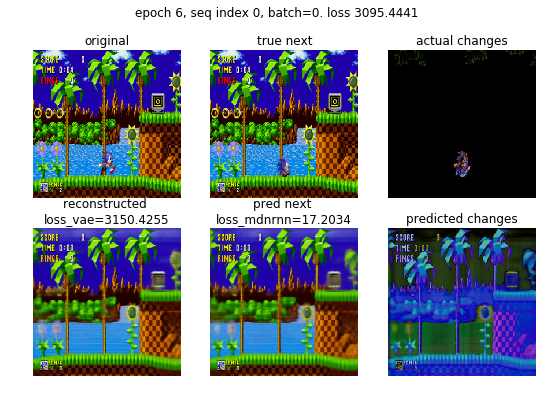

action_pred 2
action_true 7.0
finv loss 0.7218


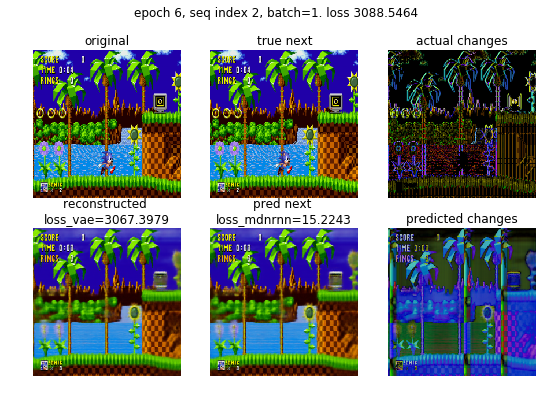

[0/2500] loss=133.7496, loss_rnn=16.1456, loss_inv= 0.7218=1* 0.7218, loss_vae=116.8822=0.0500 * (2337.22 + 0.25*|1.69 - 0|)
[400/2500] loss=46.8586, loss_rnn=15.2077, loss_inv= 0.7185=1* 0.7185, loss_vae=120.1170=0.0500 * (2401.99 + 0.25*|1.40 - 0|)
[800/2500] loss=14.3876, loss_rnn=15.1052, loss_inv= 0.7182=1* 0.7182, loss_vae=115.4744=0.0500 * (2309.14 + 0.25*|1.39 - 0|)
[1200/2500] loss=119.2461, loss_rnn=15.1225, loss_inv= 0.7179=1* 0.7179, loss_vae=114.5193=0.0500 * (2290.04 + 0.25*|1.38 - 0|)
[1600/2500] loss=14.0572, loss_rnn=15.1287, loss_inv= 0.7178=1* 0.7178, loss_vae=114.8849=0.0500 * (2297.35 + 0.25*|1.38 - 0|)
[2000/2500] loss=232.9500, loss_rnn=15.1164, loss_inv= 0.7179=1* 0.7179, loss_vae=114.9243=0.0500 * (2298.14 + 0.25*|1.37 - 0|)
[2400/2500] loss=194.2459, loss_rnn=15.1334, loss_inv= 0.7178=1* 0.7178, loss_vae=116.6538=0.0500 * (2332.73 + 0.25*|1.37 - 0|)
loss=136.3719, loss_rnn=15.1289, loss_inv= 0.7177=1* 0.7177, loss_vae=115.6677=0.0500 * (2313.01 + 0.25*|1.37 - 

[0/416] loss=150.1926, loss_rnn=14.9395, loss_inv= 0.7052=1* 0.7052, loss_vae=134.5479=0.0500 * (2690.60 + 0.25*|1.45 - 0|)
[400/416] loss=137.9155, loss_rnn=15.9586, loss_inv= 0.7158=1* 0.7158, loss_vae=134.8156=0.0500 * (2695.93 + 0.25*|1.52 - 0|)
loss=127.7835, loss_rnn=15.9595, loss_inv= 0.7157=1* 0.7157, loss_vae=134.1643=0.0500 * (2682.90 + 0.25*|1.54 - 0|)

Epoch     7: reducing learning rate of group 0 to 1.0000e-06.
Epoch 7, loss=15.1289, loss_val=15.9595, loss_vae=2313.3545, loss_vae_val=2683.2869,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7218


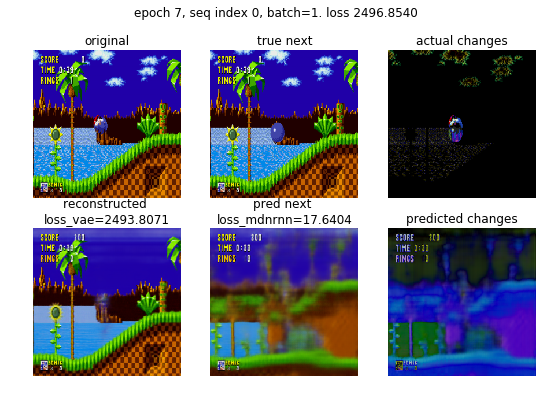

action_pred 2
action_true 9.0
finv loss 0.7218


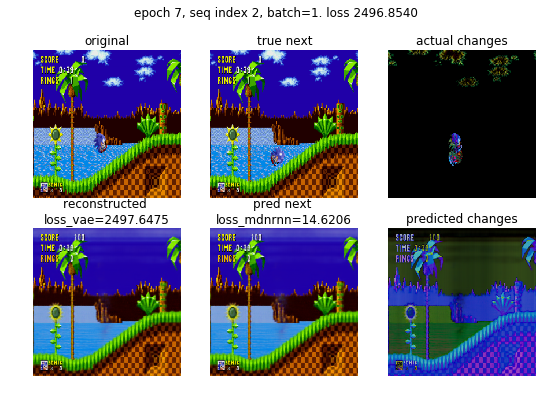

[0/2500] loss=301.6956, loss_rnn=16.6154, loss_inv= 0.7218=1* 0.7218, loss_vae=284.3584=0.0500 * (5686.83 + 0.25*|1.34 - 0|)
[400/2500] loss=125.9689, loss_rnn=15.3537, loss_inv= 0.7161=1* 0.7161, loss_vae=132.5618=0.0500 * (2650.89 + 0.25*|1.37 - 0|)
[800/2500] loss=194.2147, loss_rnn=15.2606, loss_inv= 0.7183=1* 0.7183, loss_vae=129.0673=0.0500 * (2581.01 + 0.25*|1.34 - 0|)
[1200/2500] loss=142.8929, loss_rnn=15.1552, loss_inv= 0.7188=1* 0.7188, loss_vae=123.5189=0.0500 * (2470.05 + 0.25*|1.30 - 0|)
[1600/2500] loss=13.0266, loss_rnn=15.0841, loss_inv= 0.7187=1* 0.7187, loss_vae=116.1944=0.0500 * (2323.56 + 0.25*|1.30 - 0|)
[2000/2500] loss=130.6326, loss_rnn=15.1103, loss_inv= 0.7182=1* 0.7182, loss_vae=117.9854=0.0500 * (2359.38 + 0.25*|1.31 - 0|)
[2400/2500] loss=145.5705, loss_rnn=15.0761, loss_inv= 0.7188=1* 0.7188, loss_vae=115.7221=0.0500 * (2314.11 + 0.25*|1.32 - 0|)
loss=303.3508, loss_rnn=15.0830, loss_inv= 0.7189=1* 0.7189, loss_vae=116.7085=0.0500 * (2333.84 + 0.25*|1.31 

[0/416] loss=201.1039, loss_rnn=15.8417, loss_inv= 0.7218=1* 0.7218, loss_vae=184.5404=0.0500 * (3690.41 + 0.25*|1.59 - 0|)
[400/416] loss=195.3721, loss_rnn=15.9136, loss_inv= 0.7158=1* 0.7158, loss_vae=144.8071=0.0500 * (2895.78 + 0.25*|1.43 - 0|)
loss=122.8080, loss_rnn=15.9233, loss_inv= 0.7159=1* 0.7159, loss_vae=145.7605=0.0500 * (2914.85 + 0.25*|1.43 - 0|)

Epoch 8, loss=15.0830, loss_val=15.9233, loss_vae=2334.1707, loss_vae_val=2915.2097,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 3.0
finv loss 0.7218


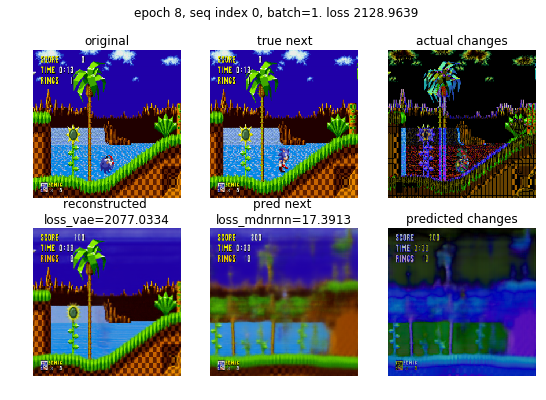

action_pred 2
action_true 0.0
finv loss 0.7218


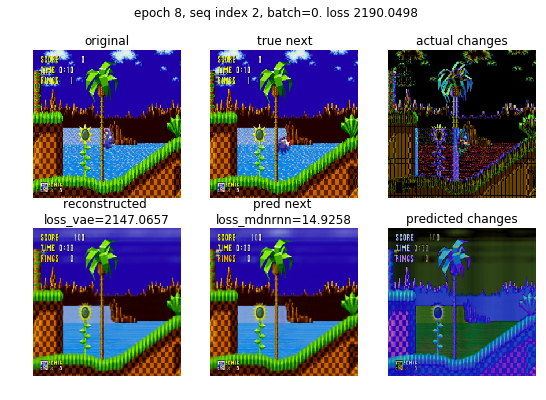

[0/2500] loss=127.0501, loss_rnn=15.4286, loss_inv= 0.7052=1* 0.7052, loss_vae=110.9164=0.0500 * (2217.98 + 0.25*|1.37 - 0|)
[400/2500] loss=23.7239, loss_rnn=15.0254, loss_inv= 0.7189=1* 0.7189, loss_vae=108.5717=0.0500 * (2171.11 + 0.25*|1.29 - 0|)
[800/2500] loss=181.6929, loss_rnn=15.0145, loss_inv= 0.7189=1* 0.7189, loss_vae=111.5296=0.0500 * (2230.27 + 0.25*|1.29 - 0|)
[1200/2500] loss=14.1860, loss_rnn=15.0626, loss_inv= 0.7184=1* 0.7184, loss_vae=113.6755=0.0500 * (2273.19 + 0.25*|1.29 - 0|)
[1600/2500] loss=179.1614, loss_rnn=15.0932, loss_inv= 0.7185=1* 0.7185, loss_vae=116.2980=0.0500 * (2325.63 + 0.25*|1.33 - 0|)
[2000/2500] loss=47.8356, loss_rnn=15.1093, loss_inv= 0.7181=1* 0.7181, loss_vae=116.6974=0.0500 * (2333.62 + 0.25*|1.33 - 0|)
[2400/2500] loss=85.1291, loss_rnn=15.0922, loss_inv= 0.7183=1* 0.7183, loss_vae=116.2591=0.0500 * (2324.85 + 0.25*|1.32 - 0|)
loss=61.6169, loss_rnn=15.0910, loss_inv= 0.7183=1* 0.7183, loss_vae=116.3584=0.0500 * (2326.84 + 0.25*|1.31 - 0|

[0/416] loss=145.8760, loss_rnn=15.4526, loss_inv= 0.7052=1* 0.7052, loss_vae=129.7182=0.0500 * (2593.87 + 0.25*|1.96 - 0|)
[400/416] loss=108.1592, loss_rnn=15.9359, loss_inv= 0.7153=1* 0.7153, loss_vae=132.6920=0.0500 * (2653.49 + 0.25*|1.41 - 0|)
loss=211.6847, loss_rnn=15.9256, loss_inv= 0.7153=1* 0.7153, loss_vae=132.6639=0.0500 * (2652.92 + 0.25*|1.42 - 0|)

Epoch 9, loss=15.0910, loss_val=15.9256, loss_vae=2327.1680, loss_vae_val=2653.2783,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7218


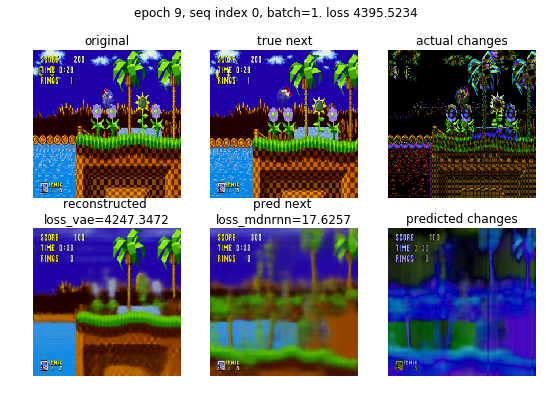

action_pred 2
action_true 5.0
finv loss 0.7218


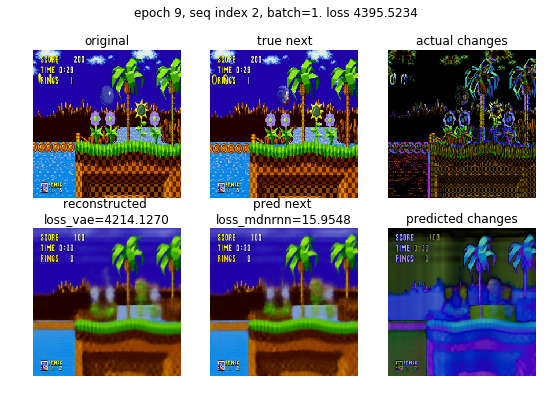

[0/2500] loss=241.1705, loss_rnn=17.0599, loss_inv= 0.7052=1* 0.7052, loss_vae=223.4054=0.0500 * (4467.90 + 0.25*|0.82 - 0|)
[400/2500] loss=302.3895, loss_rnn=14.9198, loss_inv= 0.7205=1* 0.7205, loss_vae=111.0861=0.0500 * (2221.41 + 0.25*|1.24 - 0|)
[800/2500] loss=128.4009, loss_rnn=14.9273, loss_inv= 0.7207=1* 0.7207, loss_vae=112.0600=0.0500 * (2240.88 + 0.25*|1.29 - 0|)
[1200/2500] loss=133.6898, loss_rnn=14.9170, loss_inv= 0.7205=1* 0.7205, loss_vae=109.0432=0.0500 * (2180.54 + 0.25*|1.31 - 0|)
[1600/2500] loss=142.4451, loss_rnn=14.9876, loss_inv= 0.7196=1* 0.7196, loss_vae=111.8884=0.0500 * (2237.43 + 0.25*|1.33 - 0|)
[2000/2500] loss=189.3826, loss_rnn=14.9865, loss_inv= 0.7192=1* 0.7192, loss_vae=109.5378=0.0500 * (2190.42 + 0.25*|1.33 - 0|)
[2400/2500] loss=177.8461, loss_rnn=15.0203, loss_inv= 0.7190=1* 0.7190, loss_vae=110.9038=0.0500 * (2217.74 + 0.25*|1.36 - 0|)
loss=12.9938, loss_rnn=15.0072, loss_inv= 0.7191=1* 0.7191, loss_vae=110.1002=0.0500 * (2201.67 + 0.25*|1.35 

[0/416] loss=129.0665, loss_rnn=14.9243, loss_inv= 0.7052=1* 0.7052, loss_vae=113.4370=0.0500 * (2268.37 + 0.25*|1.50 - 0|)
[400/416] loss=279.8586, loss_rnn=15.8658, loss_inv= 0.7156=1* 0.7156, loss_vae=123.8976=0.0500 * (2477.60 + 0.25*|1.40 - 0|)
loss=151.9425, loss_rnn=15.8687, loss_inv= 0.7155=1* 0.7155, loss_vae=123.5242=0.0500 * (2470.14 + 0.25*|1.40 - 0|)

Epoch 10, loss=15.0072, loss_val=15.8687, loss_vae=2202.0039, loss_vae_val=2470.4849,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7218


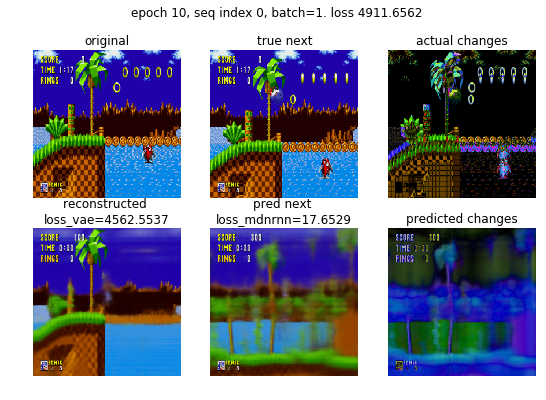

action_pred 2
action_true 9.0
finv loss 0.7218


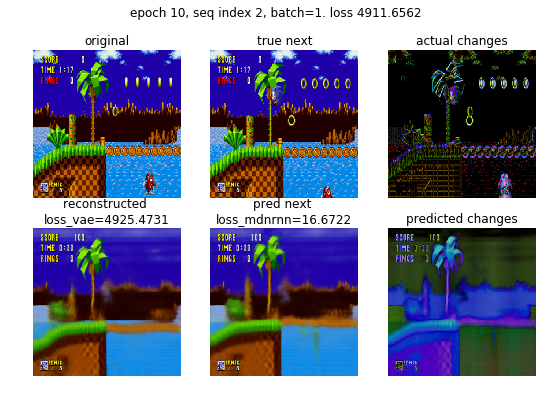

[0/2500] loss=86.4891, loss_rnn=16.2976, loss_inv= 0.7218=1* 0.7218, loss_vae=69.4696=0.0500 * (1389.04 + 0.25*|1.41 - 0|)
[400/2500] loss=149.3379, loss_rnn=14.9866, loss_inv= 0.7168=1* 0.7168, loss_vae=100.1821=0.0500 * (2003.29 + 0.25*|1.41 - 0|)
[800/2500] loss=149.9822, loss_rnn=14.8857, loss_inv= 0.7193=1* 0.7193, loss_vae=101.2346=0.0500 * (2024.35 + 0.25*|1.36 - 0|)
[1200/2500] loss=127.2347, loss_rnn=14.9186, loss_inv= 0.7190=1* 0.7190, loss_vae=104.9784=0.0500 * (2099.23 + 0.25*|1.36 - 0|)
[1600/2500] loss=242.6704, loss_rnn=14.9461, loss_inv= 0.7192=1* 0.7192, loss_vae=109.0160=0.0500 * (2179.99 + 0.25*|1.33 - 0|)
[2000/2500] loss=122.6070, loss_rnn=15.0160, loss_inv= 0.7185=1* 0.7185, loss_vae=113.4130=0.0500 * (2267.93 + 0.25*|1.33 - 0|)
[2400/2500] loss=176.6637, loss_rnn=15.0167, loss_inv= 0.7186=1* 0.7186, loss_vae=112.1943=0.0500 * (2243.55 + 0.25*|1.32 - 0|)
loss=239.9218, loss_rnn=15.0007, loss_inv= 0.7184=1* 0.7184, loss_vae=111.5853=0.0500 * (2231.38 + 0.25*|1.31 -

[0/416] loss=139.8684, loss_rnn=15.4394, loss_inv= 0.7218=1* 0.7218, loss_vae=123.7072=0.0500 * (2473.73 + 0.25*|1.66 - 0|)
[400/416] loss=130.6651, loss_rnn=15.8938, loss_inv= 0.7159=1* 0.7159, loss_vae=124.5543=0.0500 * (2490.71 + 0.25*|1.52 - 0|)
loss=207.0211, loss_rnn=15.8905, loss_inv= 0.7159=1* 0.7159, loss_vae=125.2454=0.0500 * (2504.53 + 0.25*|1.51 - 0|)

Epoch 11, loss=15.0007, loss_val=15.8905, loss_vae=2231.7061, loss_vae_val=2504.9080,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 8.0
finv loss 0.7218


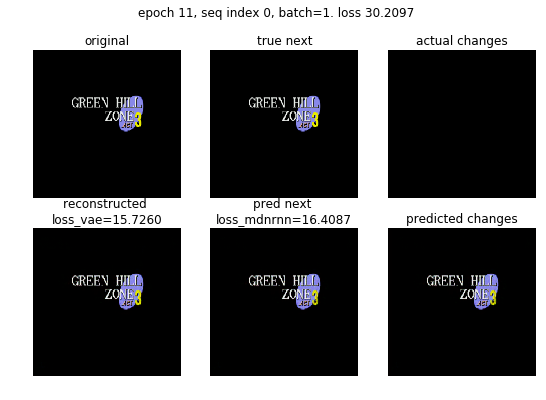

action_pred 2
action_true 2.0
finv loss 0.7218


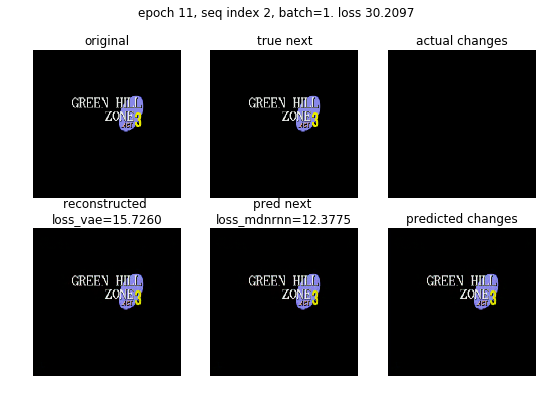

[0/2500] loss=221.2816, loss_rnn=16.7561, loss_inv= 0.7218=1* 0.7218, loss_vae=203.8036=0.0500 * (4075.69 + 0.25*|1.53 - 0|)
[400/2500] loss=232.6117, loss_rnn=15.1738, loss_inv= 0.7174=1* 0.7174, loss_vae=118.8643=0.0500 * (2376.94 + 0.25*|1.37 - 0|)
[800/2500] loss=129.4642, loss_rnn=15.1425, loss_inv= 0.7183=1* 0.7183, loss_vae=120.8744=0.0500 * (2417.15 + 0.25*|1.36 - 0|)
[1200/2500] loss=21.4700, loss_rnn=15.0951, loss_inv= 0.7187=1* 0.7187, loss_vae=117.1330=0.0500 * (2342.33 + 0.25*|1.34 - 0|)
[1600/2500] loss=113.8758, loss_rnn=15.0385, loss_inv= 0.7188=1* 0.7188, loss_vae=114.8022=0.0500 * (2295.71 + 0.25*|1.33 - 0|)
[2000/2500] loss=173.0152, loss_rnn=15.0423, loss_inv= 0.7187=1* 0.7187, loss_vae=116.4577=0.0500 * (2328.82 + 0.25*|1.33 - 0|)
[2400/2500] loss=42.2659, loss_rnn=15.0577, loss_inv= 0.7186=1* 0.7186, loss_vae=116.5163=0.0500 * (2329.99 + 0.25*|1.33 - 0|)
loss=223.1457, loss_rnn=15.0541, loss_inv= 0.7185=1* 0.7185, loss_vae=116.1421=0.0500 * (2322.51 + 0.25*|1.33 -

[0/416] loss=130.2198, loss_rnn=15.2277, loss_inv= 0.7218=1* 0.7218, loss_vae=114.2703=0.0500 * (2285.01 + 0.25*|1.60 - 0|)
[400/416] loss=242.1158, loss_rnn=15.9253, loss_inv= 0.7158=1* 0.7158, loss_vae=129.7241=0.0500 * (2594.11 + 0.25*|1.49 - 0|)
loss=126.3473, loss_rnn=15.9412, loss_inv= 0.7157=1* 0.7157, loss_vae=132.8049=0.0500 * (2655.73 + 0.25*|1.49 - 0|)

Epoch 12, loss=15.0541, loss_val=15.9412, loss_vae=2322.8416, loss_vae_val=2656.0991,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 8.0
finv loss 0.7052


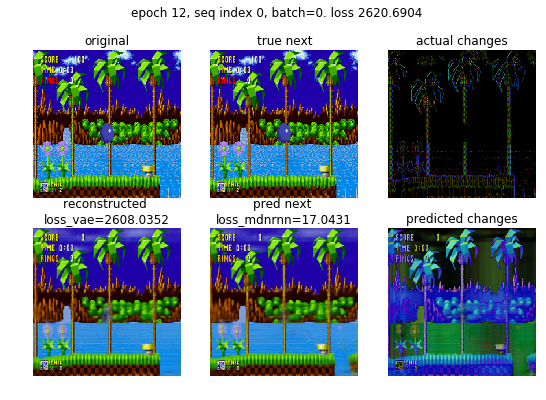

action_pred 2
action_true 2.0
finv loss 0.7052


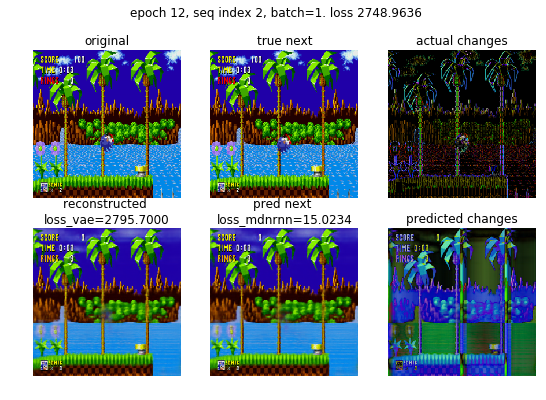

[0/2500] loss=142.6637, loss_rnn=16.1778, loss_inv= 0.7218=1* 0.7218, loss_vae=125.7641=0.0500 * (2514.89 + 0.25*|1.56 - 0|)
[400/2500] loss=87.3254, loss_rnn=15.0407, loss_inv= 0.7185=1* 0.7185, loss_vae=108.6558=0.0500 * (2172.76 + 0.25*|1.42 - 0|)
[800/2500] loss=99.2917, loss_rnn=14.9849, loss_inv= 0.7192=1* 0.7192, loss_vae=109.6702=0.0500 * (2193.07 + 0.25*|1.32 - 0|)
[1200/2500] loss=123.7691, loss_rnn=14.9939, loss_inv= 0.7184=1* 0.7184, loss_vae=109.7500=0.0500 * (2194.66 + 0.25*|1.35 - 0|)
[1600/2500] loss=101.1265, loss_rnn=15.0232, loss_inv= 0.7183=1* 0.7183, loss_vae=109.7660=0.0500 * (2194.99 + 0.25*|1.33 - 0|)
[2000/2500] loss=120.1220, loss_rnn=14.9909, loss_inv= 0.7187=1* 0.7187, loss_vae=108.8503=0.0500 * (2176.67 + 0.25*|1.33 - 0|)
[2400/2500] loss=122.4812, loss_rnn=15.0348, loss_inv= 0.7187=1* 0.7187, loss_vae=113.2689=0.0500 * (2265.05 + 0.25*|1.31 - 0|)
loss=135.5320, loss_rnn=15.0442, loss_inv= 0.7186=1* 0.7186, loss_vae=113.4236=0.0500 * (2268.14 + 0.25*|1.32 -

[0/416] loss=215.6759, loss_rnn=16.2853, loss_inv= 0.7218=1* 0.7218, loss_vae=198.6688=0.0500 * (3973.07 + 0.25*|1.22 - 0|)
[400/416] loss=126.4204, loss_rnn=15.9837, loss_inv= 0.7160=1* 0.7160, loss_vae=134.3440=0.0500 * (2686.53 + 0.25*|1.42 - 0|)
loss=184.7209, loss_rnn=15.9800, loss_inv= 0.7161=1* 0.7161, loss_vae=134.3053=0.0500 * (2685.75 + 0.25*|1.42 - 0|)

Epoch 13, loss=15.0442, loss_val=15.9800, loss_vae=2268.4724, loss_vae_val=2686.1052,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 9.0
finv loss 0.7218


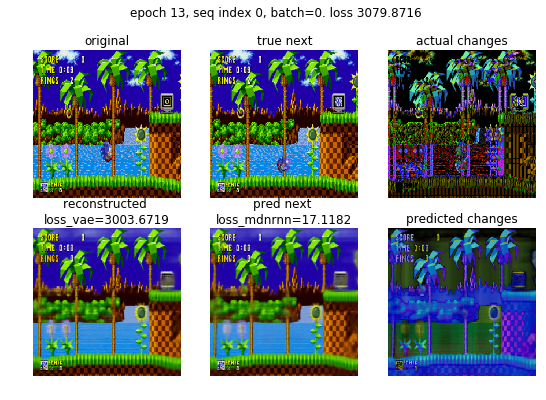

action_pred 2
action_true 2.0
finv loss 0.7218


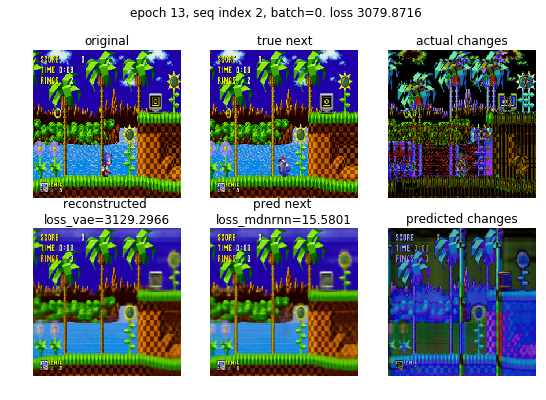

[0/2500] loss=114.2921, loss_rnn=16.7722, loss_inv= 0.7052=1* 0.7052, loss_vae=96.8148=0.0500 * (1935.93 + 0.25*|1.48 - 0|)
[400/2500] loss=13.0669, loss_rnn=15.1650, loss_inv= 0.7170=1* 0.7170, loss_vae=108.8952=0.0500 * (2177.59 + 0.25*|1.24 - 0|)
[800/2500] loss=167.5913, loss_rnn=15.1260, loss_inv= 0.7178=1* 0.7178, loss_vae=117.6610=0.0500 * (2352.90 + 0.25*|1.28 - 0|)
[1200/2500] loss=93.7474, loss_rnn=15.0254, loss_inv= 0.7186=1* 0.7186, loss_vae=114.3711=0.0500 * (2287.10 + 0.25*|1.27 - 0|)
[1600/2500] loss=128.5828, loss_rnn=15.0459, loss_inv= 0.7184=1* 0.7184, loss_vae=114.5585=0.0500 * (2290.84 + 0.25*|1.30 - 0|)
[2000/2500] loss=138.7375, loss_rnn=14.9984, loss_inv= 0.7187=1* 0.7187, loss_vae=113.2851=0.0500 * (2265.39 + 0.25*|1.27 - 0|)
[2400/2500] loss=166.5733, loss_rnn=15.0106, loss_inv= 0.7184=1* 0.7184, loss_vae=114.0135=0.0500 * (2279.95 + 0.25*|1.29 - 0|)
loss=212.9877, loss_rnn=15.0169, loss_inv= 0.7184=1* 0.7184, loss_vae=114.0348=0.0500 * (2280.37 + 0.25*|1.29 - 

[0/416] loss=157.8137, loss_rnn=15.6065, loss_inv= 0.7218=1* 0.7218, loss_vae=141.4853=0.0500 * (2829.22 + 0.25*|1.96 - 0|)
[400/416] loss=177.4781, loss_rnn=15.9104, loss_inv= 0.7155=1* 0.7155, loss_vae=113.5231=0.0500 * (2270.09 + 0.25*|1.49 - 0|)
loss=200.1968, loss_rnn=15.9171, loss_inv= 0.7156=1* 0.7156, loss_vae=115.5917=0.0500 * (2311.47 + 0.25*|1.47 - 0|)

Epoch    14: reducing learning rate of group 0 to 1.0000e-07.
Epoch 14, loss=15.0169, loss_val=15.9171, loss_vae=2280.6960, loss_vae_val=2311.8345,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7052


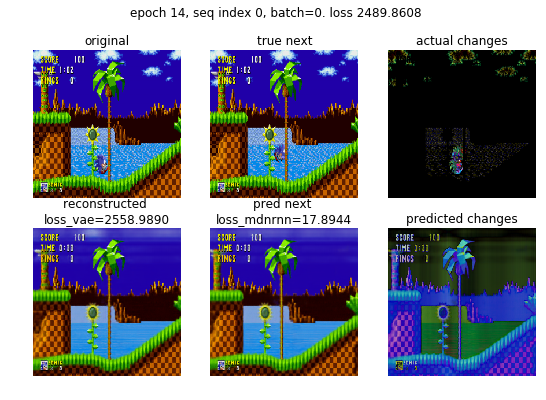

action_pred 2
action_true 8.0
finv loss 0.7052


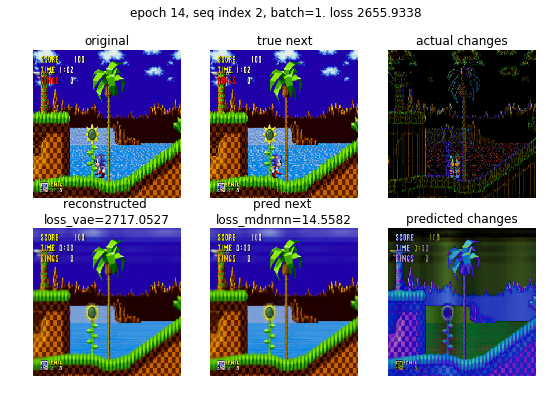

[0/2500] loss=283.6229, loss_rnn=16.5022, loss_inv= 0.7218=1* 0.7218, loss_vae=266.3988=0.0500 * (5327.87 + 0.25*|0.44 - 0|)
[400/2500] loss=129.1364, loss_rnn=15.2190, loss_inv= 0.7171=1* 0.7171, loss_vae=125.3026=0.0500 * (2505.75 + 0.25*|1.20 - 0|)
[800/2500] loss=198.4796, loss_rnn=15.1010, loss_inv= 0.7177=1* 0.7177, loss_vae=116.0330=0.0500 * (2320.34 + 0.25*|1.28 - 0|)
[1200/2500] loss=54.9754, loss_rnn=15.1194, loss_inv= 0.7172=1* 0.7172, loss_vae=116.6520=0.0500 * (2332.72 + 0.25*|1.27 - 0|)
[1600/2500] loss=12.8977, loss_rnn=15.0741, loss_inv= 0.7180=1* 0.7180, loss_vae=115.4129=0.0500 * (2307.94 + 0.25*|1.28 - 0|)
[2000/2500] loss=132.8463, loss_rnn=15.0364, loss_inv= 0.7186=1* 0.7186, loss_vae=113.8989=0.0500 * (2277.65 + 0.25*|1.30 - 0|)
[2400/2500] loss=164.7345, loss_rnn=15.0150, loss_inv= 0.7185=1* 0.7185, loss_vae=112.8313=0.0500 * (2256.30 + 0.25*|1.31 - 0|)
loss=77.8822, loss_rnn=15.0342, loss_inv= 0.7184=1* 0.7184, loss_vae=114.1701=0.0500 * (2283.07 + 0.25*|1.31 - 

[0/416] loss=71.7741, loss_rnn=13.8692, loss_inv= 0.7218=1* 0.7218, loss_vae=57.1831=0.0500 * (1143.21 + 0.25*|1.82 - 0|)
[400/416] loss=297.5876, loss_rnn=15.9882, loss_inv= 0.7161=1* 0.7161, loss_vae=144.2873=0.0500 * (2885.38 + 0.25*|1.45 - 0|)
loss=136.5483, loss_rnn=15.9907, loss_inv= 0.7163=1* 0.7163, loss_vae=146.9829=0.0500 * (2939.30 + 0.25*|1.45 - 0|)

Epoch 15, loss=15.0342, loss_val=15.9907, loss_vae=2283.4019, loss_vae_val=2939.6587,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 4.0
finv loss 0.7218


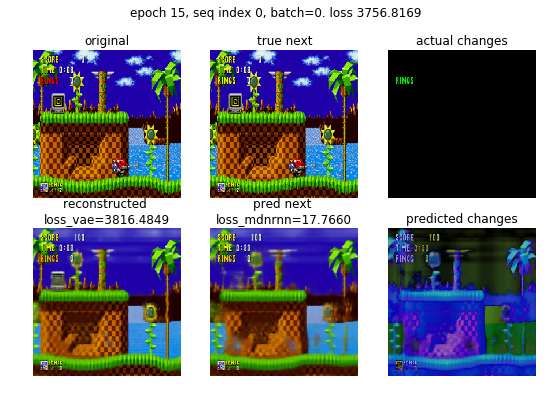

action_pred 2
action_true 1.0
finv loss 0.7218


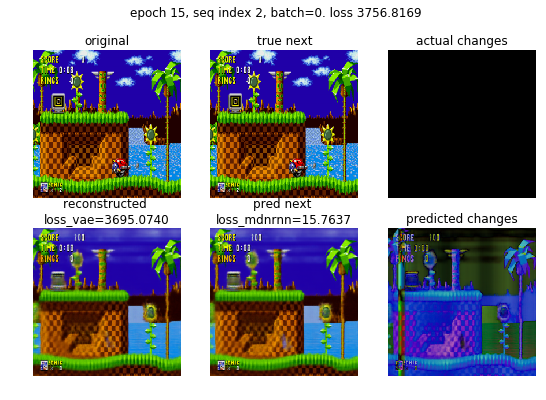

[0/2500] loss=140.0056, loss_rnn=16.2540, loss_inv= 0.7218=1* 0.7218, loss_vae=123.0298=0.0500 * (2460.25 + 0.25*|1.36 - 0|)
[400/2500] loss=116.6704, loss_rnn=15.1200, loss_inv= 0.7170=1* 0.7170, loss_vae=116.6029=0.0500 * (2331.74 + 0.25*|1.25 - 0|)
[800/2500] loss=129.7122, loss_rnn=15.0812, loss_inv= 0.7183=1* 0.7183, loss_vae=111.0022=0.0500 * (2219.71 + 0.25*|1.33 - 0|)
[1200/2500] loss=12.8987, loss_rnn=15.0713, loss_inv= 0.7176=1* 0.7176, loss_vae=108.0560=0.0500 * (2160.78 + 0.25*|1.34 - 0|)
[1600/2500] loss=118.3874, loss_rnn=15.0578, loss_inv= 0.7182=1* 0.7182, loss_vae=109.5549=0.0500 * (2190.77 + 0.25*|1.32 - 0|)
[2000/2500] loss=31.3664, loss_rnn=15.0393, loss_inv= 0.7183=1* 0.7183, loss_vae=110.0731=0.0500 * (2201.13 + 0.25*|1.32 - 0|)
[2400/2500] loss=181.0056, loss_rnn=15.0161, loss_inv= 0.7181=1* 0.7181, loss_vae=110.2215=0.0500 * (2204.10 + 0.25*|1.32 - 0|)
loss=186.1464, loss_rnn=15.0341, loss_inv= 0.7180=1* 0.7180, loss_vae=111.9097=0.0500 * (2237.87 + 0.25*|1.30 -

[0/416] loss=296.1917, loss_rnn=16.4529, loss_inv= 0.7218=1* 0.7218, loss_vae=279.0170=0.0500 * (5580.07 + 0.25*|1.07 - 0|)
[400/416] loss=15.7654, loss_rnn=16.0192, loss_inv= 0.7157=1* 0.7157, loss_vae=145.7662=0.0500 * (2914.97 + 0.25*|1.43 - 0|)
loss=18.4601, loss_rnn=15.9998, loss_inv= 0.7157=1* 0.7157, loss_vae=140.6481=0.0500 * (2812.61 + 0.25*|1.41 - 0|)

Epoch 16, loss=15.0341, loss_val=15.9998, loss_vae=2238.1941, loss_vae_val=2812.9614,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7218


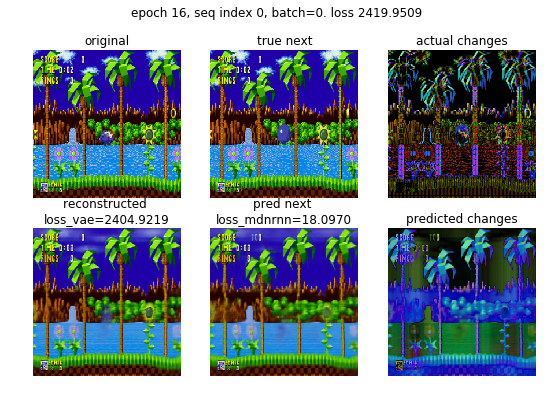

action_pred 2
action_true 0.0
finv loss 0.7218


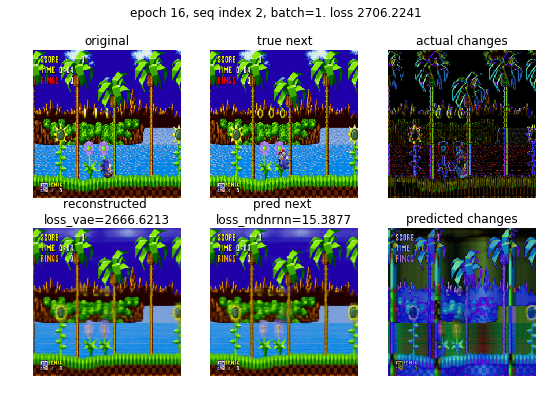

[0/2500] loss=51.9011, loss_rnn=15.4307, loss_inv= 0.7218=1* 0.7218, loss_vae=35.7486=0.0500 * (714.80 + 0.25*|0.67 - 0|)
[400/2500] loss=138.5259, loss_rnn=15.2052, loss_inv= 0.7181=1* 0.7181, loss_vae=121.8752=0.0500 * (2437.19 + 0.25*|1.26 - 0|)
[800/2500] loss=131.5806, loss_rnn=15.1497, loss_inv= 0.7175=1* 0.7175, loss_vae=118.6713=0.0500 * (2373.10 + 0.25*|1.32 - 0|)
[1200/2500] loss=52.3919, loss_rnn=15.0212, loss_inv= 0.7178=1* 0.7178, loss_vae=113.3703=0.0500 * (2267.08 + 0.25*|1.32 - 0|)
[1600/2500] loss=44.2662, loss_rnn=15.0817, loss_inv= 0.7178=1* 0.7178, loss_vae=115.5673=0.0500 * (2311.01 + 0.25*|1.33 - 0|)
[2000/2500] loss=85.6610, loss_rnn=15.0834, loss_inv= 0.7178=1* 0.7178, loss_vae=115.6607=0.0500 * (2312.88 + 0.25*|1.32 - 0|)
[2400/2500] loss=116.4794, loss_rnn=15.0504, loss_inv= 0.7181=1* 0.7181, loss_vae=114.4727=0.0500 * (2289.13 + 0.25*|1.31 - 0|)
loss=205.6311, loss_rnn=15.0715, loss_inv= 0.7181=1* 0.7181, loss_vae=115.6082=0.0500 * (2311.83 + 0.25*|1.32 - 0|)

[0/416] loss=114.5834, loss_rnn=15.4247, loss_inv= 0.7218=1* 0.7218, loss_vae=98.4369=0.0500 * (1968.29 + 0.25*|1.78 - 0|)
[400/416] loss=128.9191, loss_rnn=15.8874, loss_inv= 0.7147=1* 0.7147, loss_vae=119.5421=0.0500 * (2390.47 + 0.25*|1.49 - 0|)
loss=145.0788, loss_rnn=15.8822, loss_inv= 0.7147=1* 0.7147, loss_vae=119.5705=0.0500 * (2391.04 + 0.25*|1.49 - 0|)

Epoch 17, loss=15.0715, loss_val=15.8822, loss_vae=2312.1641, loss_vae_val=2391.4099,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7052


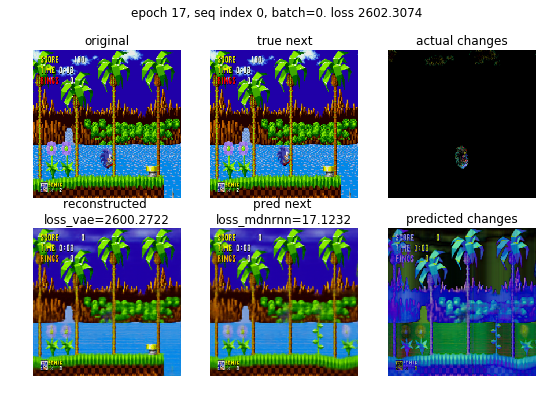

action_pred 2
action_true 6.0
finv loss 0.7052


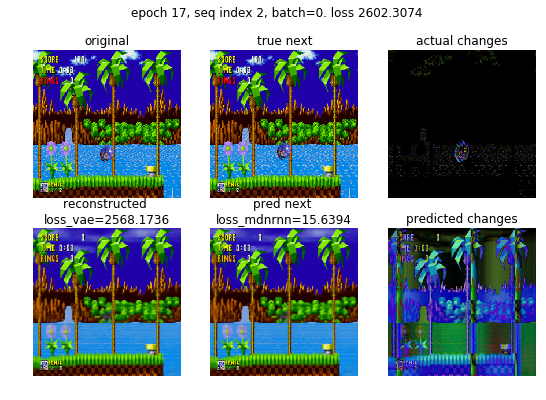

[0/2500] loss=138.1569, loss_rnn=15.4938, loss_inv= 0.7218=1* 0.7218, loss_vae=121.9413=0.0500 * (2438.47 + 0.25*|1.43 - 0|)
[400/2500] loss=205.9510, loss_rnn=14.7026, loss_inv= 0.7220=1* 0.7220, loss_vae=100.6675=0.0500 * (2013.04 + 0.25*|1.24 - 0|)
[800/2500] loss=141.0145, loss_rnn=14.8831, loss_inv= 0.7194=1* 0.7194, loss_vae=104.2783=0.0500 * (2085.24 + 0.25*|1.30 - 0|)
[1200/2500] loss=41.3159, loss_rnn=15.0190, loss_inv= 0.7188=1* 0.7188, loss_vae=112.4241=0.0500 * (2248.16 + 0.25*|1.31 - 0|)
[1600/2500] loss=74.7483, loss_rnn=14.9832, loss_inv= 0.7189=1* 0.7189, loss_vae=108.5453=0.0500 * (2170.58 + 0.25*|1.31 - 0|)
[2000/2500] loss=197.0583, loss_rnn=15.0337, loss_inv= 0.7185=1* 0.7185, loss_vae=110.7097=0.0500 * (2213.86 + 0.25*|1.32 - 0|)
[2400/2500] loss=146.1259, loss_rnn=15.0296, loss_inv= 0.7184=1* 0.7184, loss_vae=111.3901=0.0500 * (2227.47 + 0.25*|1.31 - 0|)
loss=71.6523, loss_rnn=15.0242, loss_inv= 0.7184=1* 0.7184, loss_vae=111.1937=0.0500 * (2223.55 + 0.25*|1.30 - 

[0/416] loss=132.3747, loss_rnn=16.0513, loss_inv= 0.7052=1* 0.7052, loss_vae=115.6183=0.0500 * (2312.05 + 0.25*|1.27 - 0|)
[400/416] loss=117.2976, loss_rnn=15.9584, loss_inv= 0.7156=1* 0.7156, loss_vae=133.7700=0.0500 * (2675.04 + 0.25*|1.43 - 0|)
loss=132.5684, loss_rnn=15.9298, loss_inv= 0.7155=1* 0.7155, loss_vae=133.0784=0.0500 * (2661.21 + 0.25*|1.43 - 0|)

Epoch    18: reducing learning rate of group 0 to 1.0000e-08.
Epoch 18, loss=15.0242, loss_val=15.9298, loss_vae=2223.8748, loss_vae_val=2661.5686,  loss_finv=nan, loss_finv_vae=nan, ,
tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 9.0
finv loss 0.7218


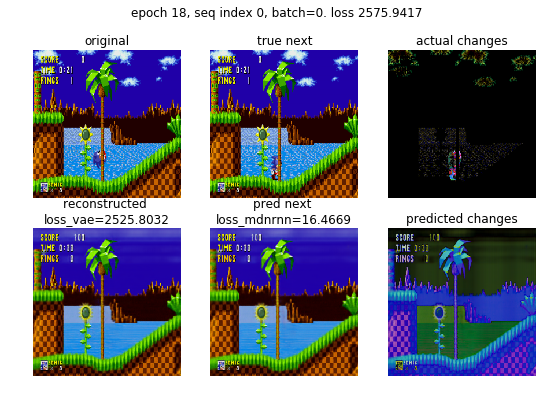

action_pred 2
action_true 4.0
finv loss 0.7218


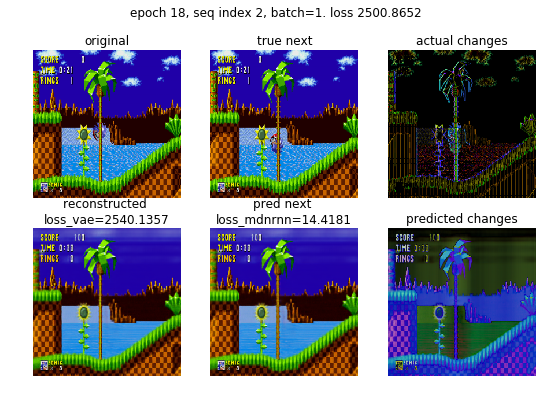

[0/2500] loss=115.4650, loss_rnn=15.7199, loss_inv= 0.7052=1* 0.7052, loss_vae=99.0400=0.0500 * (1980.43 + 0.25*|1.47 - 0|)
[400/2500] loss=142.0793, loss_rnn=14.9642, loss_inv= 0.7187=1* 0.7187, loss_vae=108.8878=0.0500 * (2177.43 + 0.25*|1.31 - 0|)



KeyboardInterrupt: 

In [38]:
for epoch in range(num_epochs):
    # Run
    info = train(loader_train, vae, mdnrnn, optimizer, max_batches=max_batches, test=False, cuda=True, joint_training=True)
    torch.cuda.empty_cache()
    info_val = train(loader_test, vae, mdnrnn, optimizer, max_batches=max_batches//6, test=True, cuda=True, joint_training=True)
    torch.cuda.empty_cache()
    
    # Adjust
    scheduler.step(np.mean(info_val['loss_mdn']))
    
    # View
    print('Epoch {}, loss={:2.4f}, loss_val={:2.4f}, loss_vae={:2.4f}, loss_vae_val={:2.4f},  loss_finv={:2.4f}, loss_finv_vae={:2.4f}, ,'.format(
        epoch, 
        np.mean(info['loss_mdn']), 
        np.mean(info_val['loss_mdn']),
        np.mean(info['loss_vae']), 
        np.mean(info_val['loss_vae']),
        np.mean(info['loss_finv']),
        np.mean(info_val['loss_finv'])
    ))
    plot_results(loader_test, n=2, epoch=epoch)
    
    # Record
    history = {k+'_val':np.mean(v) for k,v in info_val.items()}
    history.update({k:np.mean(v) for k,v in info.items()})
    histories.append(history)
    
    torch.save(mdnrnn.state_dict(), './outputs/models/{NAME}-mdnrnn_{epoch}_state_dict.pkl'.format(NAME=NAME, epoch=epoch))
    torch.save(vae.state_dict(), './outputs/models/{NAME}-vae_{epoch}_state_dict.pkl'.format(NAME=NAME, epoch=epoch))
    torch.save(finv.state_dict(), './outputs/models/{NAME}-finv_{epoch}_state_dict.pkl'.format(NAME=NAME, epoch=epoch))
        
    # Tidy
    torch.cuda.empty_cache()

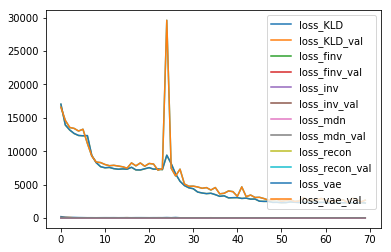

In [39]:
import pandas as pd
df_history = pd.DataFrame(histories)
df_history.plot()
df_history.to_csv('./outputs/models/{NAME}.csv'.format(NAME=NAME), index=False)

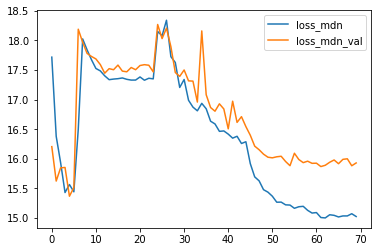

In [40]:
df_history[['loss_mdn','loss_mdn_val']].plot()

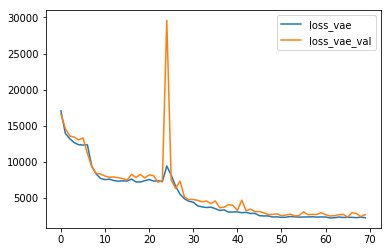

In [41]:
df_history[['loss_vae','loss_vae_val']].plot()

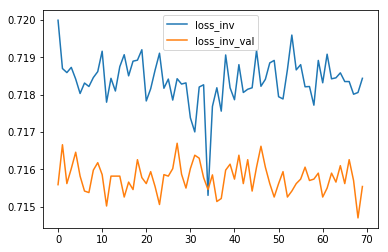

In [42]:
df_history[['loss_inv','loss_inv_val']].plot()

## Save

In [43]:
torch.save(mdnrnn.state_dict(), './outputs/models/{NAME}-mdnrnn_state_dict.pkl'.format(NAME=NAME))
torch.save(vae.state_dict(), './outputs/models/{NAME}-vae_state_dict.pkl'.format(NAME=NAME))
torch.save(finv.state_dict(), './outputs/models/{NAME}-finv_state_dict.pkl'.format(NAME=NAME))


# torch.save(mdnrnn, f'./outputs/models/{NAME}-mdnrnn.pkl')
# torch.save(vae, f'./outputs/models/{NAME}-vae')
# torch.save(finv.state_dict(), f'./outputs/models/{NAME}-finv.pkl')

## View

tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7052


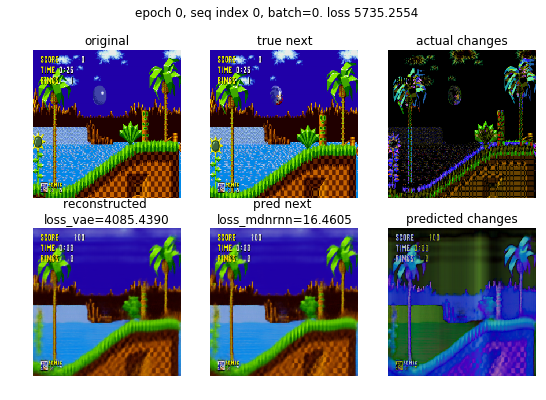

action_pred 2
action_true 2.0
finv loss 0.7052


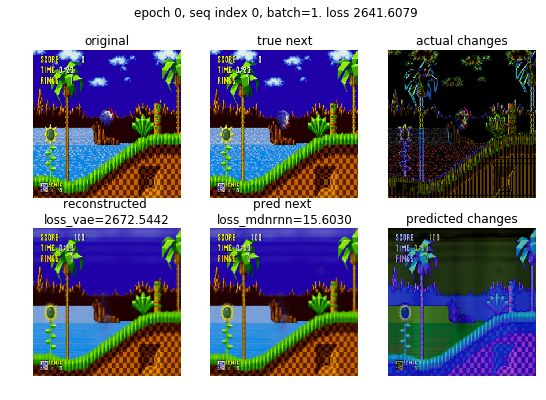

action_pred 2
action_true 0.0
finv loss 0.7052


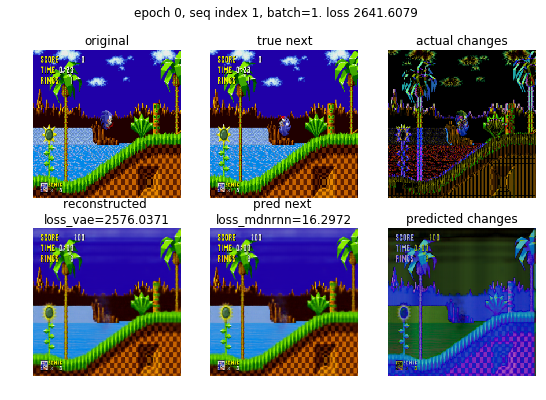

action_pred 2
action_true 2.0
finv loss 0.7052


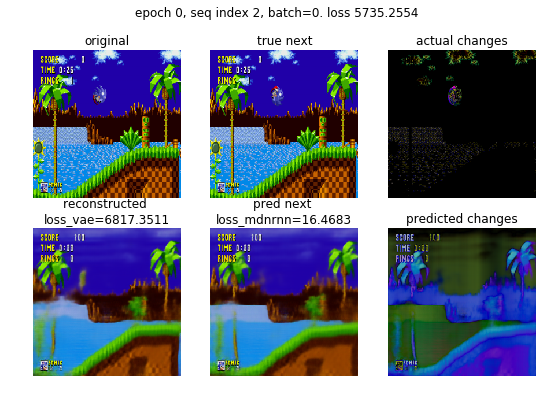

In [44]:
plot_results(loader_test, n=4, epoch=0)

tensor([[ 2,  2,  2],
        [ 2,  2,  2]], device='cuda:0')
action_pred 2
action_true 2.0
finv loss 0.7052


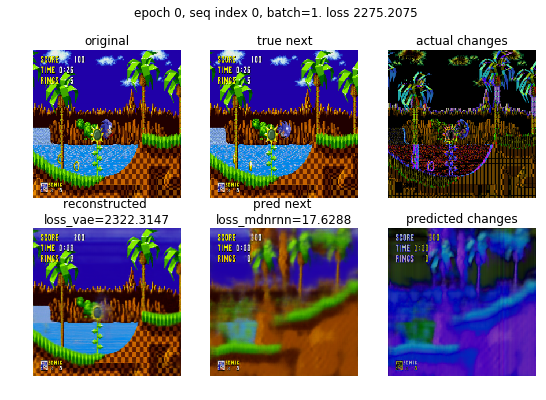

action_pred 2
action_true 2.0
finv loss 0.7052


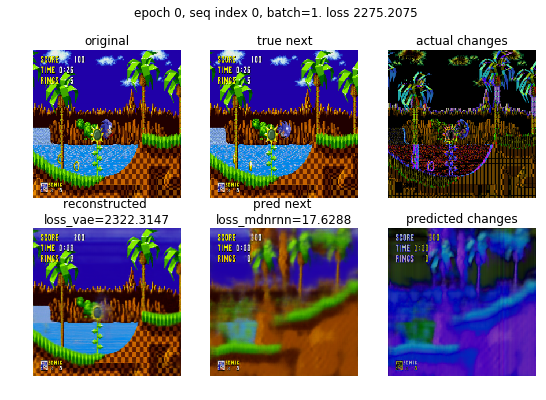

action_pred 2
action_true 9.0
finv loss 0.7052


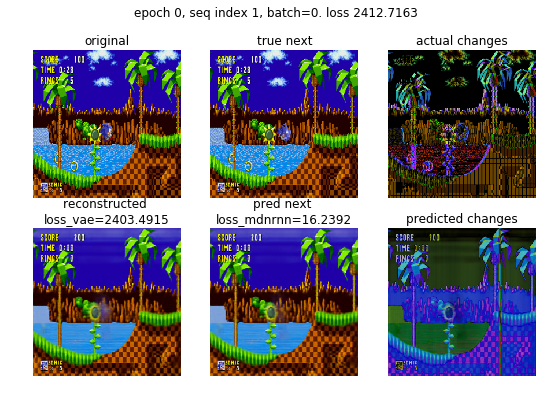

action_pred 2
action_true 5.0
finv loss 0.7052


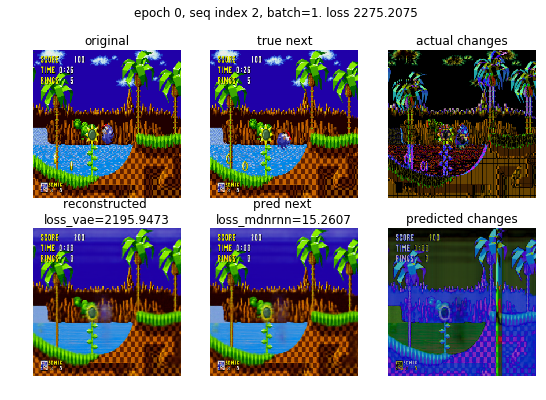

In [45]:
plot_results(loader_train, n=4, epoch=0)

In [35]:
torch.cuda.empty_cache()

# Summarize models

In [ ]:
img = np.random.randn(image_size, image_size, 3)
action = np.array(np.random.randint(0,action_dim))[np.newaxis]
action = Variable(torch.from_numpy(action)).float().cuda()[np.newaxis]
gpu_img = Variable(torch.from_numpy(img[np.newaxis].transpose(0, 3, 1, 2))).float().cuda()
if cuda:
    gpu_img = gpu_img.cuda()
with TorchSummarizeDf(vae) as tdf:
    x, mu_vae, logvar_vae = vae.forward(gpu_img)
    z = vae.sample(mu_vae, logvar_vae)
    df_vae = tdf.make_df()
#     loss_recon, loss_KLD = loss_function_vae(Y, x, mu_vae, sigma_vae)
#     loss_vae = loss_recon + lambda_vae_kld * torch.abs(loss_KLD-C)
#     loss_vae = loss_vae.mean() # mean along the batches


df_vae[df_vae.level<2]


In [ ]:
with TorchSummarizeDf(mdnrnn) as tdf: 
    pi, mu, sigma, hidden_state = mdnrnn.forward(z.unsqueeze(1).repeat((1,2,1)), action.repeat((1,2)))
    z_next = mdnrnn.sample(pi, mu, sigma)
#     loss_mdn = mdnrnn.rnn_loss(z, pi, mu, sigma).mean()
    df_mdnrnn = tdf.make_df()
    
df_mdnrnn

In [ ]:
#     loss = loss_mdn + gamma_vae * loss_vae
with TorchSummarizeDf(finv) as tdf:
    action_pred = finv(z.repeat((1,2,1)), z_next)
        
    df_finv = tdf.make_df()
    
del img, action, gpu_img, x, mu, z
df_finv

In [ ]:
action_pred

# DEBUG

In [ ]:
# DEBUG the distributions
vae.train()
mdnrnn.train()

observations, actions, rewards, dones = next(iter(loader_train))

X = Variable(observations.transpose(1,3))
_, channels, height, width = X.size()
if cuda:
    X=X.cuda()
Y, mu_vae, logvar = vae.forward(X)
loss_recon, loss_KLD = loss_function_vae(Y, X, mu_vae, logvar)
loss_vae = loss_recon + lambda_vae_kld * torch.abs(loss_KLD-C)

# TODO do we want to sample in test or training mode?
z_v = vae.sample(mu_vae, logvar)

z_v = z_v.view(batch_size, seq_len, -1)
Y = Y.view((batch_size, seq_len, channels, height, width))
X = X.view((batch_size, seq_len, channels, height, width))
loss_vae = loss_vae.view(batch_size, seq_len, -1)
actions = actions.view(batch_size, seq_len)

# Forward
actions_v = Variable(actions).float()


if cuda:
    z_v=z_v.cuda()
    actions_v=actions_v.cuda()
pi, mu, sigma, hidden_state = mdnrnn.forward(z_v, actions_v)

loss = mdnrnn.rnn_loss(z_v, pi, mu, sigma)

# mu = mu.mean(2).view((batch_size*seq_len, mdnrnn.z_dim))
# X_pred = vae.decode(mu)
# X_pred = X_pred.view((batch_size, seq_len, channels, height, width))


mdnrnn.train()

zs=mdnrnn.sample(pi, mu, sigma)







z_v = vae.sample(mu_vae, logvar)
plt.hist(z_v.cpu().data.numpy().flatten(), bins=50)
plt.title('z_v')
plt.show()

plt.hist(zs.cpu().data.numpy().flatten(), bins=50)
plt.title('z_pred')
plt.show()

plt.hist(mu_vae.cpu().data.numpy().flatten(), bins=50)
plt.title('mu_vae')
plt.show()

plt.hist(mu.cpu().data.numpy().flatten(), bins=50)
plt.title('mu')
plt.show()

plt.hist(logvar.exp().cpu().data.numpy().flatten(), bins=50)
plt.title('sigma_vae')
plt.show()

plt.hist(sigma.cpu().data.numpy().flatten(), bins=50)
plt.title('sigma')
plt.show()
